# Multi-omics integration - preprocessing of RNA and ATAC datasets from multiome data 

In this notebook we will perform exploratory analysis and dimensionality reduction on matched scRNA-seq and scATAC-seq data of developing brain cortex from [Trevino et al.2021](https://www.cell.com/cell/fulltext/S0092-8674(21)00942-9?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS0092867421009429%3Fshowall%3Dtrue), focusing on differentiation of excitatory glutamatergic neurons.

The purpose of this notebook is to showcase functionality of the `scanpy` and `muon` packages for preprocessing and analysis of scRNA-seq and scATAC-seq datasets respectively. We will use this as a "warm-up", if you are familiar with these workflows already you can skip to [multi-modal dimensionality reduction](https://github.com/fmicompbio/adv_singlecell_2022/blob/day1_diff/day2_multi-omics/multiomics_joint.ipynb).

In [1]:
## Load required packages
import numpy as np
import pandas as pd
import scipy

import muon as mu
import anndata
import scanpy as sc
import anndata as ad

## Plotting packages
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

In [2]:
## Set plotting parameters for scanpy
sc.set_figure_params(figsize=[9,9], color_map = 'viridis_r')

## Load single-omic data

The data for each omic view is stored in [`AnnData`](https://anndata.readthedocs.io/en/latest/index.html) ("annotated data") format. An `AnnData` object allows us to store a matrix and add annotations to its different dimensions, defined as “observations” (i.e. cells), and measured “variables” (i.e. genes for the RNA view and peaks for the ATAC view). See [this tutorial](https://anndata-tutorials.readthedocs.io/en/latest/getting-started.html) for a quick-start on the structure of AnnData objects.

We downloaded the original datasets following the instructions in https://github.com/GreenleafLab/brainchromatin, which we further cleaned, filtered and  converted to `AnnData` objects saved in `.h5ad` files.

In [6]:
## Put the path to the data here
# # from AWS instance
data_dir = "/data/day2_multi-omics/"

In [7]:
rna_adata = sc.read_h5ad('{d}/Trevino_multiome_RNA_clean.h5ad'.format(d=data_dir))

In [8]:
atac_adata = sc.read_h5ad('{d}/Trevino_multiome_ATAC_clean.h5ad'.format(d=data_dir))

We can access the annotations on cells using `adata.obs` (cell type annotations are stored in `rna_adata.obs["cluster_name"]`, while cells that belong to the glutamatergic neuron differentiation trajectory are marked in `rna_adata.obs['in_GluN_trajectory']`). Notably, since these datasets are generated with 10X Multiome, the names of all cells are matched between the two datasets (you can check using `adata.obs_names`).

In [10]:
rna_adata.obs

,Sample_ID,Sample_Age,Sample_Batch,Cell_Barcode,RNA_Counts,RNA_Features,Dissociation_ID,percentMT,percentRibo,CR_Estimated_number_of_cells,clusterID,cluster_name,cluster_name_long,Assay,in_GluN_trajectory
hft_ctx_w21_dc1r3_r1_AAACAGCCAGCAATAA,hft_ctx_w21_dc1r3_r1,pcw21,b2020_11,AAACAGCCAGCAATAA,2494,1435,A,0.000796,0.017516,3534,c10,GluN5,Glutamatergic neuron 5,Multiome_RNA,True
hft_ctx_w21_dc1r3_r1_AAACAGCCAGCTCATA,hft_ctx_w21_dc1r3_r1,pcw21,b2020_11,AAACAGCCAGCTCATA,2257,1288,A,0.012798,0.033098,3534,c2,IN1,Interneuron 1,Multiome_RNA,False
hft_ctx_w21_dc1r3_r1_AAACATGCACGTTACA,hft_ctx_w21_dc1r3_r1,pcw21,b2020_11,AAACATGCACGTTACA,3485,1632,A,0.031098,0.039372,3534,c0,nIPC/GluN1,Neuronal intermediate progenitor cell/Glutamat...,Multiome_RNA,True
hft_ctx_w21_dc1r3_r1_AAACATGCATAAACCT,hft_ctx_w21_dc1r3_r1,pcw21,b2020_11,AAACATGCATAAACCT,2266,1247,A,0.012319,0.021557,3534,c4,IN2,Interneuron 2,Multiome_RNA,False
hft_ctx_w21_dc1r3_r1_AAACATGCATTTAAGC,hft_ctx_w21_dc1r3_r1,pcw21,b2020_11,AAACATGCATTTAAGC,2741,1495,A,0.012341,0.020690,3534,c4,IN2,Interneuron 2,Multiome_RNA,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hft_ctx_w21_dc2r2_r2_TTTGGTGCATGAATAG,hft_ctx_w21_dc2r2_r2,pcw21,b2020_11,TTTGGTGCATGAATAG,4538,1910,B,0.006583,0.010753,2764,c4,IN2,Interneuron 2,Multiome_RNA,False
hft_ctx_w21_dc2r2_r2_TTTGTCCCAGTTTACG,hft_ctx_w21_dc2r2_r2,pcw21,b2020_11,TTTGTCCCAGTTTACG,5925,2155,B,0.012747,0.012244,2764,c4,IN2,Interneuron 2,Multiome_RNA,False
hft_ctx_w21_dc2r2_r2_TTTGTCTAGTGAGCAA,hft_ctx_w21_dc2r2_r2,pcw21,b2020_11,TTTGTCTAGTGAGCAA,3496,1631,B,0.003410,0.025291,2764,c2,IN1,Interneuron 1,Multiome_RNA,False
hft_ctx_w21_dc2r2_r2_TTTGTGAAGACAGGCG,hft_ctx_w21_dc2r2_r2,pcw21,b2020_11,TTTGTGAAGACAGGCG,4099,1935,B,0.061999,0.044979,2764,c0,nIPC/GluN1,Neuronal intermediate progenitor cell/Glutamat...,Multiome_RNA,True


In [9]:
atac_adata.obs

,Sample_ID,Sample_Age,Sample_Batch,Cell_Barcode,Dissociation_ID,Assay
hft_ctx_w21_dc1r3_r1_AAACAGCCAGCAATAA,hft_ctx_w21_dc1r3_r1,pcw21,b2020_11,AAACAGCCAGCAATAA,A,Multiome_ATAC
hft_ctx_w21_dc1r3_r1_AAACAGCCAGCTCATA,hft_ctx_w21_dc1r3_r1,pcw21,b2020_11,AAACAGCCAGCTCATA,A,Multiome_ATAC
hft_ctx_w21_dc1r3_r1_AAACATGCACGTTACA,hft_ctx_w21_dc1r3_r1,pcw21,b2020_11,AAACATGCACGTTACA,A,Multiome_ATAC
hft_ctx_w21_dc1r3_r1_AAACATGCATAAACCT,hft_ctx_w21_dc1r3_r1,pcw21,b2020_11,AAACATGCATAAACCT,A,Multiome_ATAC
hft_ctx_w21_dc1r3_r1_AAACATGCATTTAAGC,hft_ctx_w21_dc1r3_r1,pcw21,b2020_11,AAACATGCATTTAAGC,A,Multiome_ATAC
...,...,...,...,...,...,...
hft_ctx_w21_dc2r2_r2_TTTGGTGCATGAATAG,hft_ctx_w21_dc2r2_r2,pcw21,b2020_11,TTTGGTGCATGAATAG,B,Multiome_ATAC
hft_ctx_w21_dc2r2_r2_TTTGTCCCAGTTTACG,hft_ctx_w21_dc2r2_r2,pcw21,b2020_11,TTTGTCCCAGTTTACG,B,Multiome_ATAC
hft_ctx_w21_dc2r2_r2_TTTGTCTAGTGAGCAA,hft_ctx_w21_dc2r2_r2,pcw21,b2020_11,TTTGTCTAGTGAGCAA,B,Multiome_ATAC
hft_ctx_w21_dc2r2_r2_TTTGTGAAGACAGGCG,hft_ctx_w21_dc2r2_r2,pcw21,b2020_11,TTTGTGAAGACAGGCG,B,Multiome_ATAC


In [12]:
all(atac_adata.obs_names == rna_adata.obs_names)

True

We can access the annotation on features (genes for RNA modality, peaks for ATAC modality) in `adata.var`. Here we also store the genomic coordinates of the peaks, which we will use later. Notice the big difference in feature numbers between the two datasets.

In [121]:
rna_adata.var

,gene_id,gene_type,gene_name
ENSG00000243485,ENSG00000243485.5,lincRNA,MIR1302-2HG
ENSG00000237613,ENSG00000237613.2,lincRNA,FAM138A
ENSG00000186092,ENSG00000186092.5,protein_coding,OR4F5
ENSG00000238009,ENSG00000238009.6,lincRNA,AL627309.1
ENSG00000239945,ENSG00000239945.1,lincRNA,AL627309.3
...,...,...,...
ENSG00000212907,ENSG00000212907.2,protein_coding,MT-ND4L
ENSG00000198886,ENSG00000198886.2,protein_coding,MT-ND4
ENSG00000198786,ENSG00000198786.2,protein_coding,MT-ND5
ENSG00000198695,ENSG00000198695.2,protein_coding,MT-ND6


In [122]:
atac_adata.var

,seqnames,start,end,width,strand,name
0,chr1,180451,180951,501,*,c7_peak_1
1,chr1,181254,181754,501,*,c2_peak_1
2,chr1,191223,191723,501,*,c9_peak_1
3,chr1,630059,630559,501,*,c6_peak_5
4,chr1,633776,634276,501,*,c8_peak_4
...,...,...,...,...,...,...
467310,chr22,50756935,50757435,501,*,c5_peak_81501
467311,chr22,50760237,50760737,501,*,c2_peak_113398
467312,chr22,50775143,50775643,501,*,c8_peak_104552
467313,chr22,50783378,50783878,501,*,c6_peak_126089b


## Preprocessing and exploration of RNA modality

We can start preprocessing and exploring the RNA data, using the standard functions implemented in `scanpy`. 

In this case cells have already been filtered by percentage of mitochondrial counts and total counts, so we start by filtering genes.

In [13]:
sc.pp.filter_genes(rna_adata, min_cells=3)

Then we normalize and log-transform the raw counts. __Note:__ AnnData objects allow to store multiple matrices of the same dimensions (`n_obs` x `n_vars`) in a slot called `adata.layers`. Here for example we can save the raw count matrix before normalization. 

In this example, we won't need the count matrix downstream, and we will still have it saved in the original .h5ad file if needed.

In [15]:
sc.pp.normalize_total(rna_adata, target_sum=10e4)
sc.pp.log1p(rna_adata)

We identify highly variable genes for dimensionality reduction

In [16]:
sc.pp.highly_variable_genes(rna_adata,min_mean=0.0125, max_mean=3, min_disp=0.5)

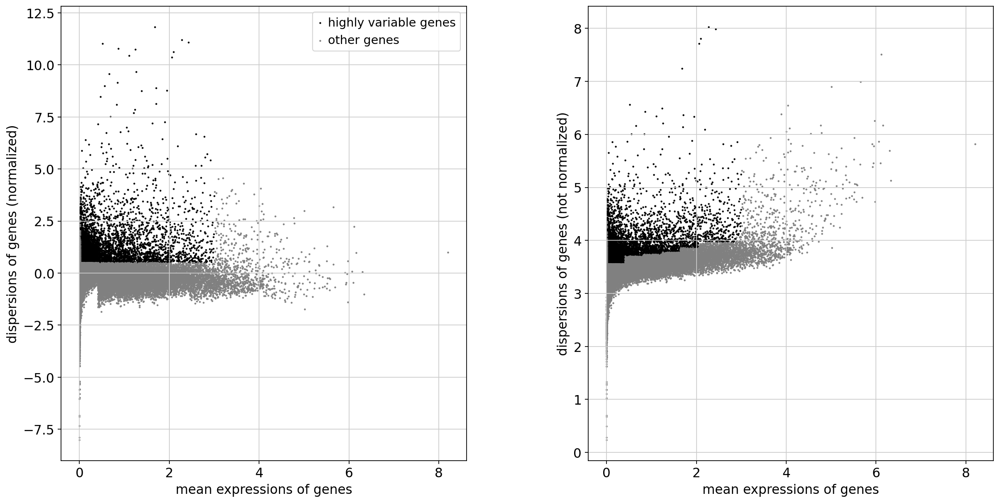

In [17]:
sc.pl.highly_variable_genes(rna_adata)

Let's check how many genes are identified as highly variable

In [18]:
np.sum(rna_adata.var.highly_variable)

5471

Next we run dimensionality reduction with PCA and use principal components to construct a K-nearest neighbor graph for UMAP visualization

In [19]:
sc.pp.pca(rna_adata)
sc.pp.neighbors(rna_adata, n_neighbors=30, n_pcs=30)
sc.tl.umap(rna_adata)

In [20]:
rna_adata.obs['in_GluN_trajectory'] = rna_adata.obs['in_GluN_trajectory'].astype('int')

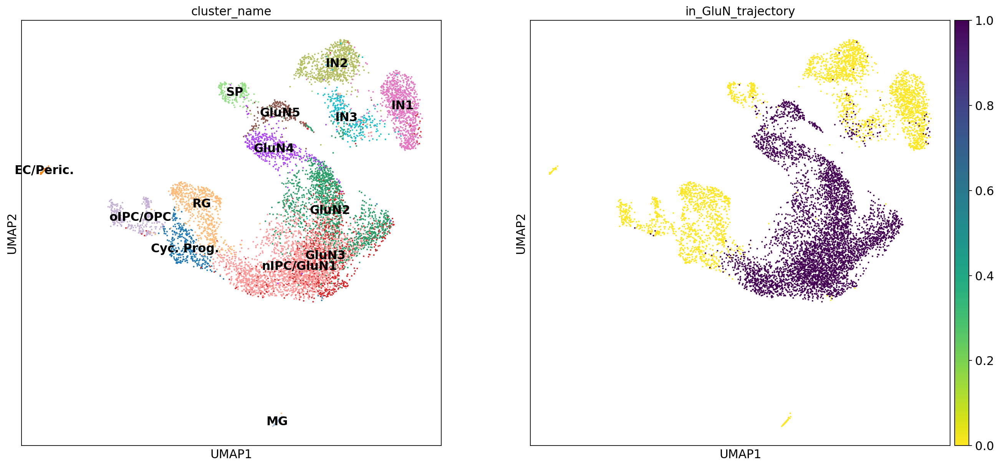

In [21]:
sc.pl.umap(rna_adata, color=["cluster_name", 'in_GluN_trajectory'], legend_loc="on data")

We can see differences in expression of known marker genes for neuronal intermediate progenitor cells (nIPC) and different stages of differentiation of glutamatergic excitatory neurons (GluN).

In [22]:
marker_genes = {
    "nIPC":['EOMES', 'PPP1R17', 'PENK', 'NEUROG1', 'NEUROG2'],
    "GluN":['NEUROD2', 'TBR1', 'BCL11B', 'SATB2', 'SLC17A7']
               }

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:891: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['AL627309.1', 'AL627309.5', 'AL669831.2', 'AL669831.5', 'FAM87B']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


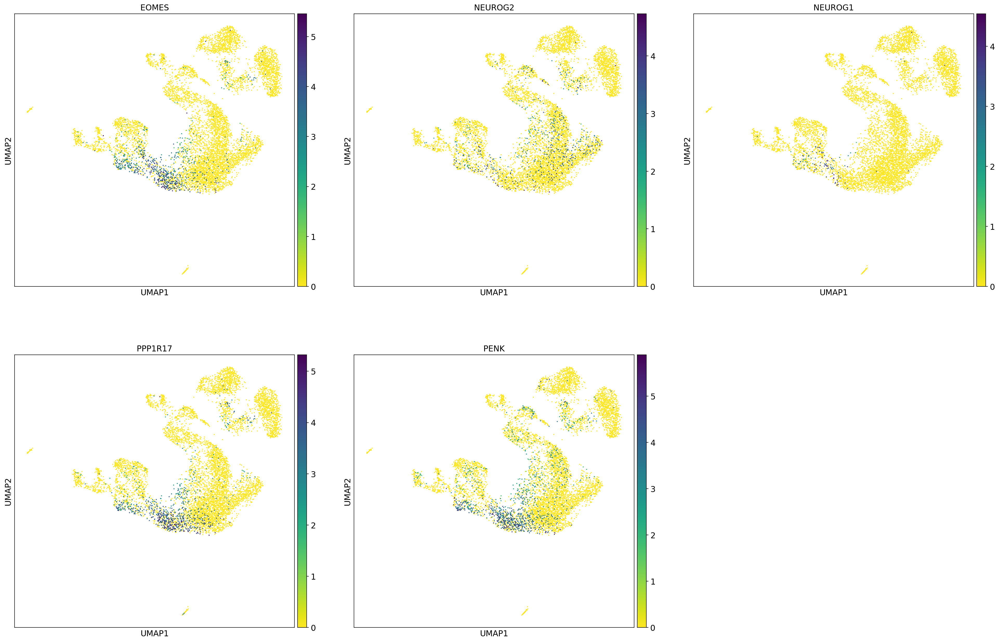

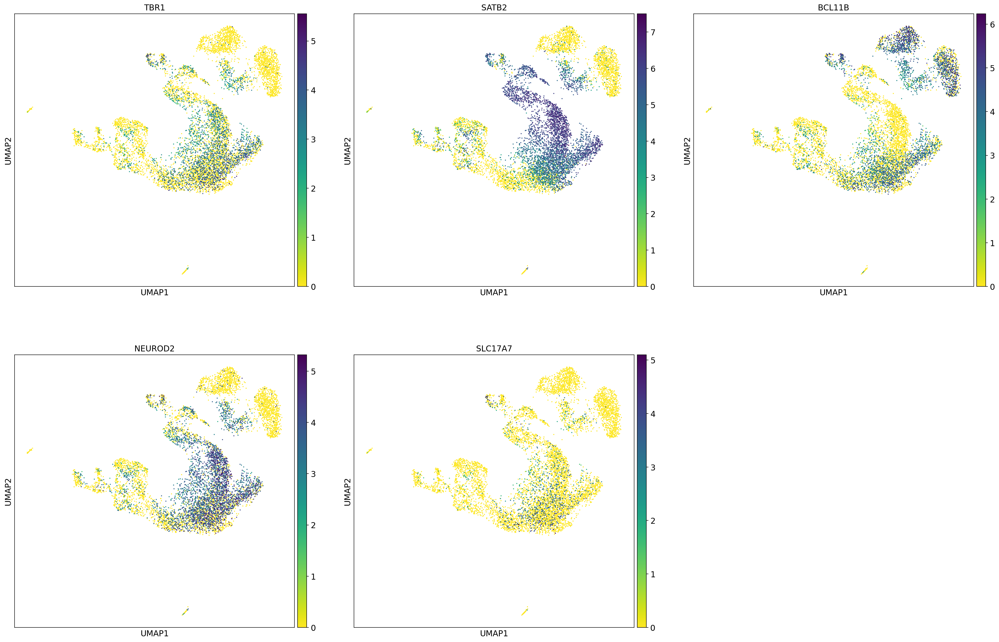

In [23]:
rna_adata.var_names = rna_adata.var["gene_name"].values.copy()
sc.pl.umap(rna_adata, color=rna_adata.var_names[rna_adata.var_names.isin(marker_genes["nIPC"])], ncols=3)
sc.pl.umap(rna_adata, color=rna_adata.var_names[rna_adata.var_names.isin(marker_genes["GluN"])], ncols=3)

We can use simple [diffusion pseudotime](https://www.nature.com/articles/nmeth.3971) to order excitatory neurons along a differentiation trajectory stemming from the nIPCs. 

In [24]:
## Subset to glutamatergic neurons
ext_rna_adata = rna_adata[rna_adata.obs["in_GluN_trajectory"] == 1].copy()
sc.pp.highly_variable_genes(ext_rna_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pp.pca(ext_rna_adata)
sc.pp.neighbors(ext_rna_adata, n_neighbors=10, n_pcs=20)
sc.tl.umap(ext_rna_adata)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


We visualize diffusion components to pick a root cell for pseudotime inference (expressing nIPC markers)

In [25]:
sc.tl.diffmap(ext_rna_adata)

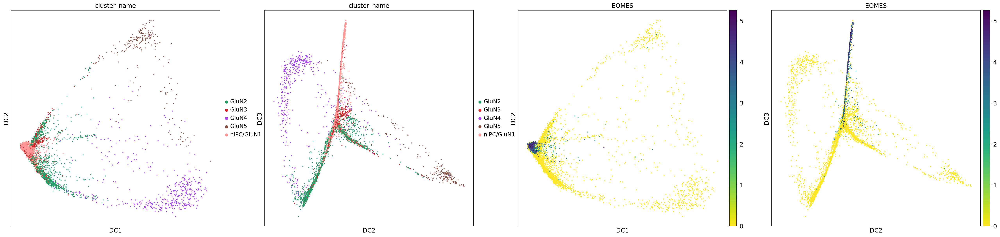

In [26]:
sc.pl.diffmap(ext_rna_adata, color=['cluster_name', marker_genes['nIPC'][0]], components=['1,2','2,3'])

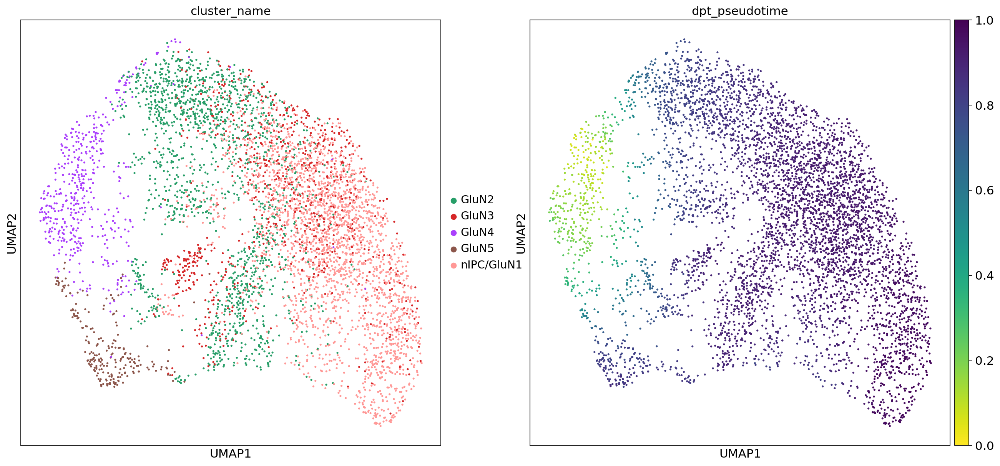

In [150]:
## Define the putative root cell (minimum for DC2 as the root nIPC)
ext_rna_adata.uns['iroot'] = ext_rna_adata.obsm["X_diffmap"][:,2].argmin() 
sc.tl.dpt(ext_rna_adata, n_dcs=5)
sc.pl.umap(ext_rna_adata, color=['cluster_name', "dpt_pseudotime"])

We can check different patterns of expression along pseudotime for the GluN marker genes

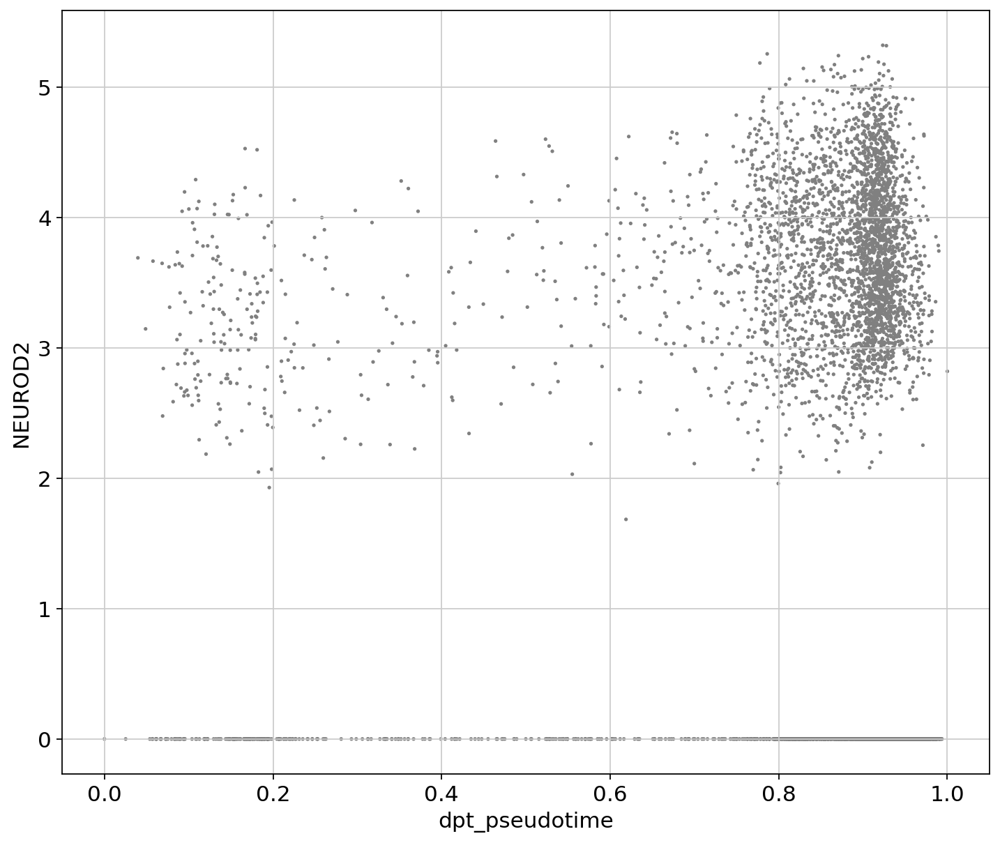

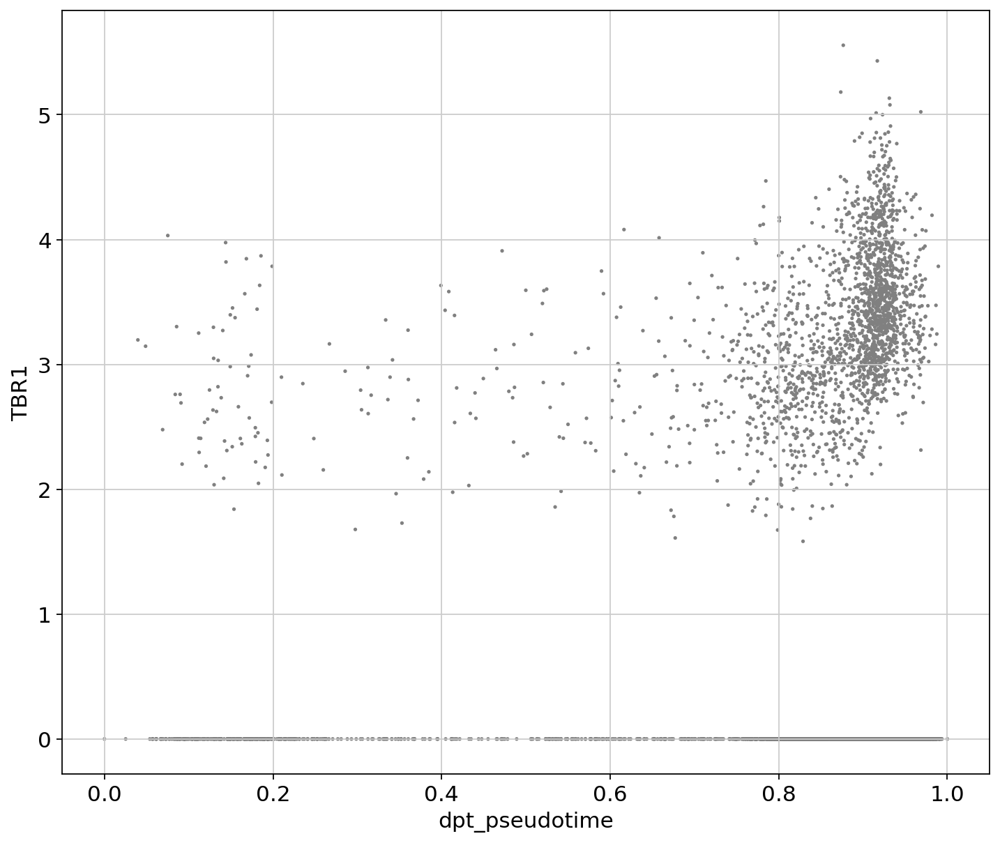

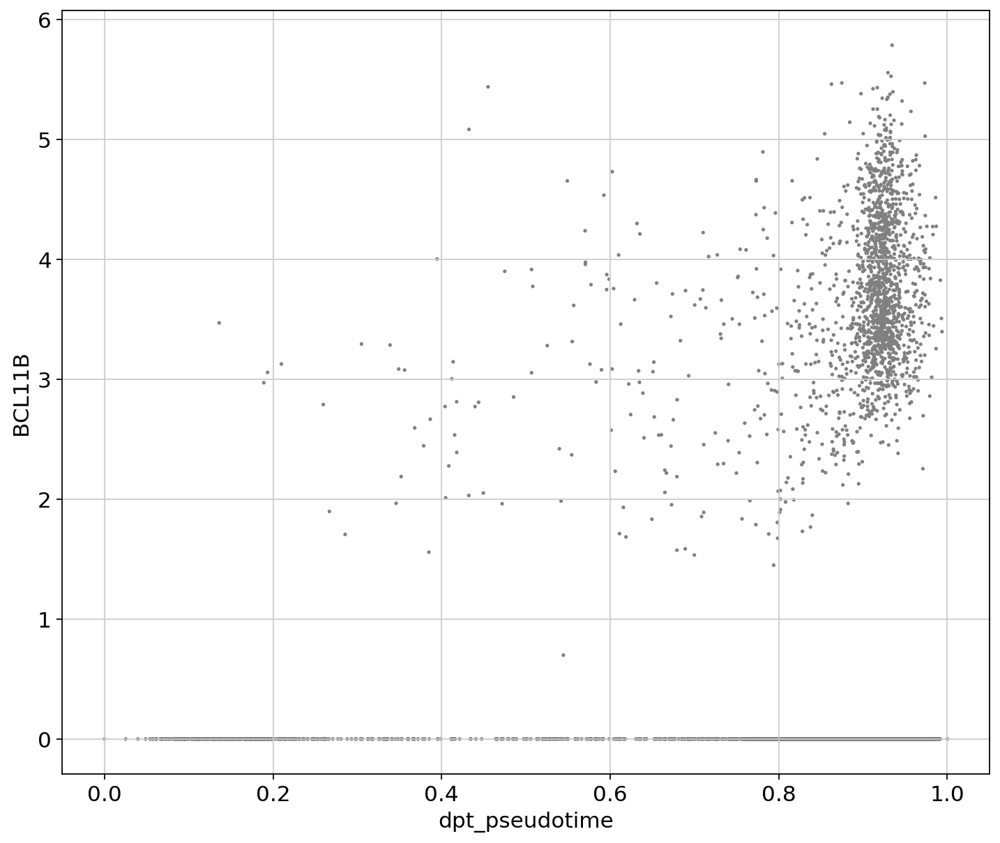

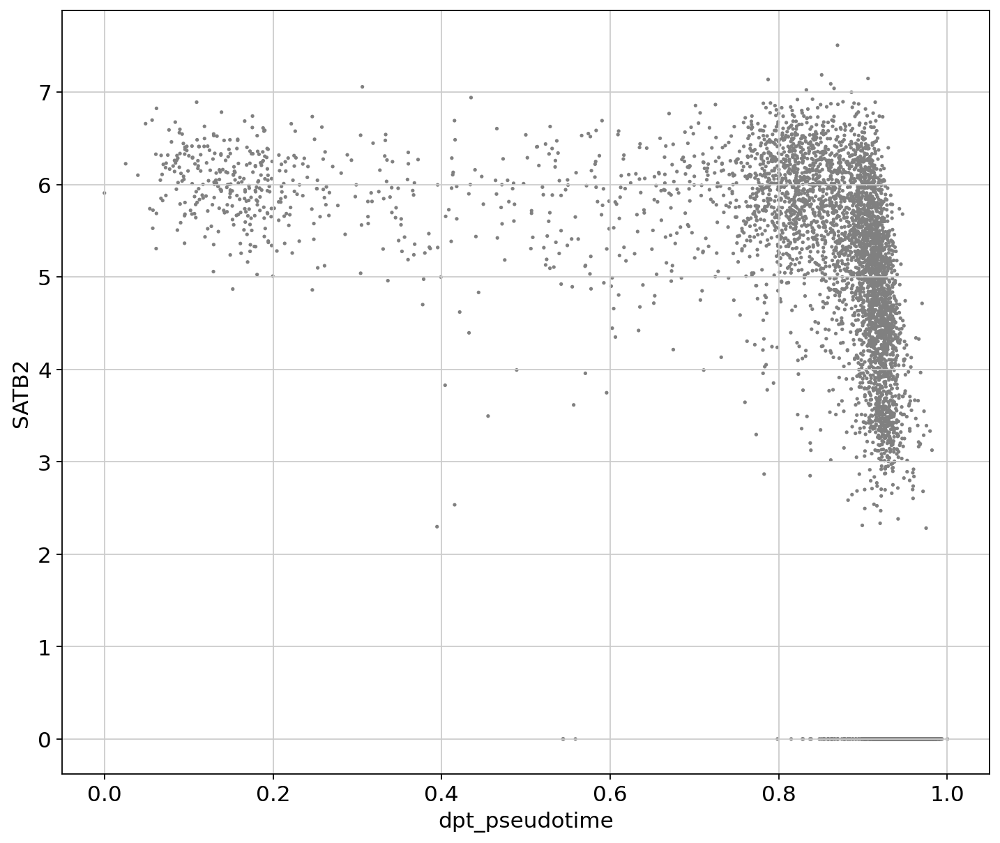

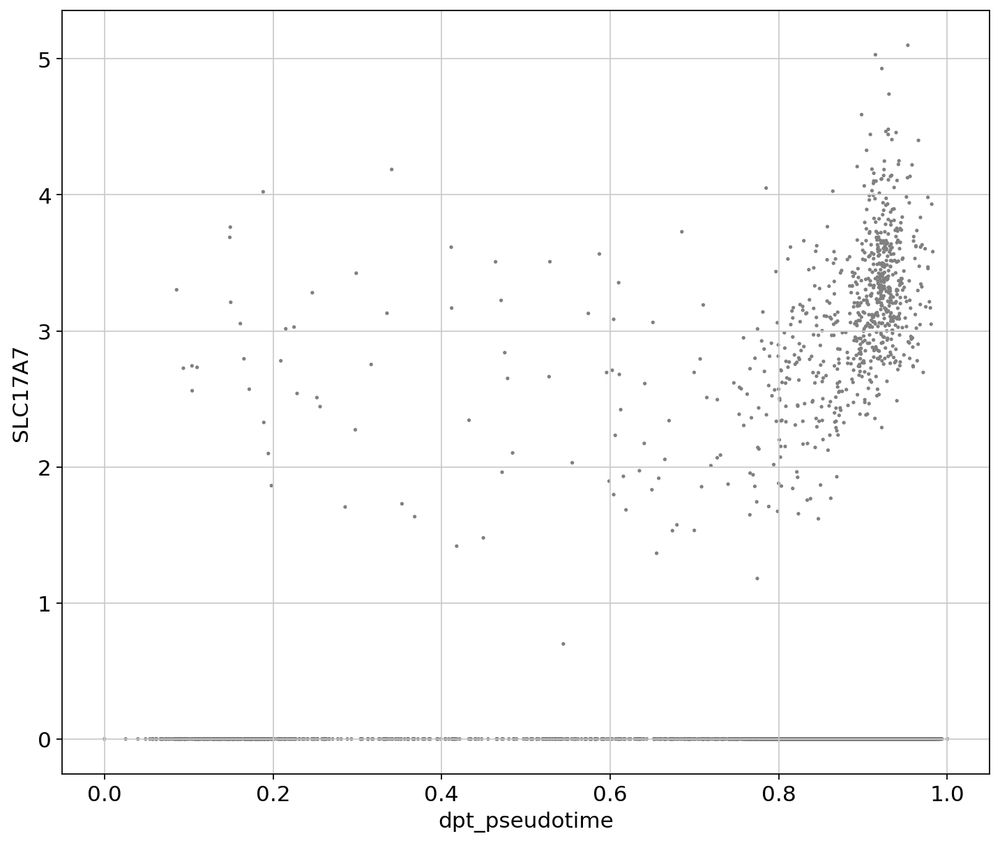

In [151]:
for g in marker_genes["GluN"]:
    sc.pl.scatter(ext_rna_adata, 'dpt_pseudotime', g)

### Find genomic coordinates of genes

This will be useful to find accessible peaks proximal to genes during joint analysis. We access Ensembl gene annotations from python directly using the package [pyensembl](https://github.com/openvax/pyensembl). 

In [102]:
from pyensembl import EnsemblRelease

## Utility function to parse 
# gene annotations from pyensembl
def ens_genes2df(genes):
    '''
    Convert pyemsembl genes to feature 
    dataframe readable by muon
    '''
    genes_df = pd.DataFrame()
    genes_df['Chromosome'] = ["chr" + x.contig for x in genes]
    genes_df['Start'] = [x.start for x in genes]
    genes_df['End'] = [x.end for x in genes]
    genes_df['GeneName'] = [x.gene_name for x in genes]
    genes_df['GeneID'] = [x.gene_id for x in genes]
    return(genes_df)

In [103]:
## Get gene annotations and ranges from pyensembl
data = EnsemblRelease(77)
gene_names = data.genes()
genes_df = ens_genes2df(gene_names)
genes_df.index = genes_df['GeneID'].values.copy()

In [55]:
## Merge by GeneIDs
rna_adata.var["GeneID"] = [x[0] for x in rna_adata.var['gene_id'].str.split(".")]
rna_var = rna_adata.var.copy()
rna_var = pd.merge(rna_var, genes_df, how='left', on='GeneID')
rna_var.index = rna_adata.var_names.copy()
rna_adata.var = rna_var.copy()

Save processed data

In [67]:
# ## Save processed RNA object
# rna_adata.write_h5ad('{d}/Trevino_multiome_RNA_clean.preprocessed.h5ad'.format(d=data_dir))

... storing 'Chromosome' as categorical
... storing 'GeneName' as categorical


---

## Preprocessing and exploration of ATAC modality

We are going to use the functions for preprocessing of scATAC data in python implemented in `muon`

In [57]:
from muon import atac as ac
import pybedtools
import pyensembl

</div> <div class="alert alert-block alert-warning"><b>Warning: </b> several steps below take a significant amount of time and compute resources to run. To avoid long waiting times, you can read and test these steps, but all the output is already saved in the AnnData object saved in Trevino_multiome_ATAC_clean.preprocessed.h5ad

### Explore QC metrics
Note that here some filtering was already performed

In [61]:
sc.pp.calculate_qc_metrics(atac_adata, percent_top=None, log1p=False, inplace=True)

We first check cell level metrics. Of note, here we don't do any additional filtering, to keep the same set of cells as in the RNA modality.

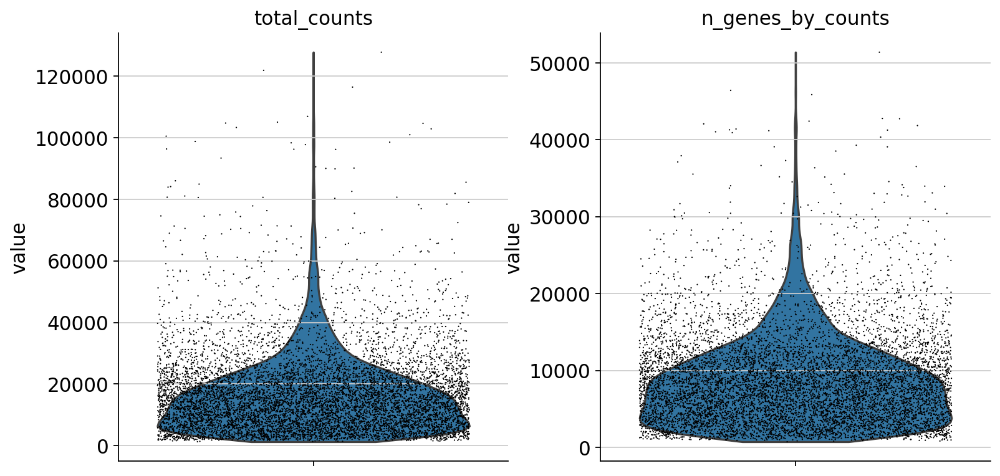

In [72]:
sc.pl.violin(atac_adata, ['total_counts', 'n_genes_by_counts'], jitter=0.4, multi_panel=True)

Then we check peak level metrics. Here we want to reduce the number of peaks we are using, excluding regions accessible in very few cells The minimum number of cells should be decided considering the expected size of the smallest cell population in your dataset. In this case we can leverage the annotation from the RNA modality

In [79]:
rna_adata.obs['cluster_name'].value_counts()

nIPC/GluN1    2348
GluN2         1546
IN1            959
GluN3          798
IN2            780
RG             646
GluN4          459
Cyc. Prog.     341
oIPC/OPC       309
IN3            301
GluN5          223
SP             190
MG              50
EC/Peric.       31
Name: cluster_name, dtype: int64

We take the smallest cluster size as minimum number of cells in which a peak should be accessible. Clearly this could lead to loss of information at the subpopulation level, but since we will mostly focus on the neuron clusters, and not the vasculature cells (EC/Peric.), we accept this tradeoff.

In [80]:
mu.pp.filter_var(atac_adata, 'n_cells_by_counts', lambda x: x >= 30)
# This is analogous to
#   sc.pp.filter_genes(rna, min_cells=10)
# but does in-place filtering and avoids copying the object

Again, here QC metrics such as the signal at Transcriptional Start Sites and cell and gene filtering were already calculated and used for filtering cells (see implementation in [muon.atac](https://muon.readthedocs.io/en/latest/omics/atac.html)).

Since scATAC data is extremely sparse and most non-zero values in it are 1 and 2, it's common practice to binarize the data matrix.

In [85]:
ac.pp.binarize(atac_adata)

In [88]:
atac_adata

AnnData object with n_obs × n_vars = 8981 × 308071
    obs: 'Sample_ID', 'Sample_Age', 'Sample_Batch', 'Cell_Barcode', 'Dissociation_ID', 'Assay', 'n_genes_by_counts', 'total_counts'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'name', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

Now we want to perform dimensionality reduction to visualize our scATAC cells with UMAP. Notably, the stardard PCA on log-normalized used for scRNA-seq data isn't suitable for ATAC data, mainly because there is no good way of selecting "highly variable features" in a binary (or quasi-binary) matrix. Here we will use a simple dimensionality reduction approach called Latent Semantic Indexing (or alternatively Latent Semantic Analysis). Please note that there are several alternative methods/models for dimensionality reduction of scATAC data (e.g. [cisTopic](https://www.nature.com/articles/s41592-019-0367-1), [peakVI](https://www.biorxiv.org/content/10.1101/2021.04.29.442020v1.full), [scOpen](https://www.biorxiv.org/content/10.1101/865931v3)). These are more computationally-intensive, but often show more robust performance than LSI, especially when low quality cells haven't been filtered out thoroughly.

With LSI, we normalize the data to minimize the differences driven by total coverage from each cell using a procedure named Term Frequency - Inverse Document Frequency (or TF-IDF). This is a normalization technique adapted from text processing, were we consider each peak as a "term" in a "document" (the cell). This is typically followed by singular value decomposition (SVD) — the same technique that convential principal component analysis (PCA) uses — to generate latent dimensions. The combination of TF-IDF and SVD is referred to as Latent Semantic Indexing (LSI).

TF-IDF normalization is implemented in `muon.atac`.

In [ ]:
## To store binarized counts in layers
# atac_adata.layers['bin_counts'] = atac_adata.X.copy()

In [92]:
ac.pp.tfidf(atac_adata, scale_factor=1e4)

In [93]:
## For the PCA step, we can use the standard scanpy function or ac.pp.lsi
# (this can take a while, many features!)
sc.pp.pca(atac_adata)

A word of caution on LSI: typically we see that the first latent factor or the first few latent factors found with this procedure are very strongly correlated with the total counts in the cells. Some workflows suggest excluding these latent factors that simply capture the coverage. In practice, it's not straight-forward to decide which latent factors should be kept and which should be excluded, so for now we keep them all.

In [94]:
atac_adata.obsm["X_lsi"] = atac_adata.obsm["X_pca"].copy()
atac_adata.obs["LSI_f1"] = atac_adata.obsm["X_lsi"][:,0]
atac_adata.obs["LSI_f2"] = atac_adata.obsm["X_lsi"][:,1]

In [95]:
sc.pp.calculate_qc_metrics(atac_adata, percent_top=None, log1p=False, inplace=True)

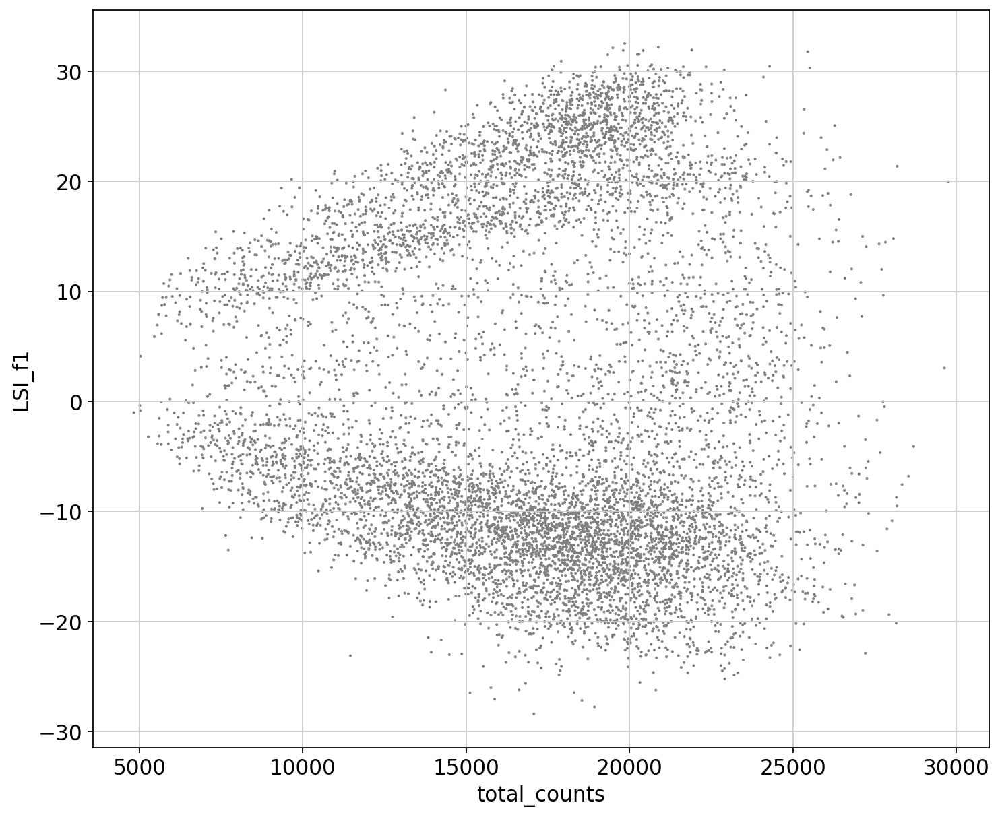

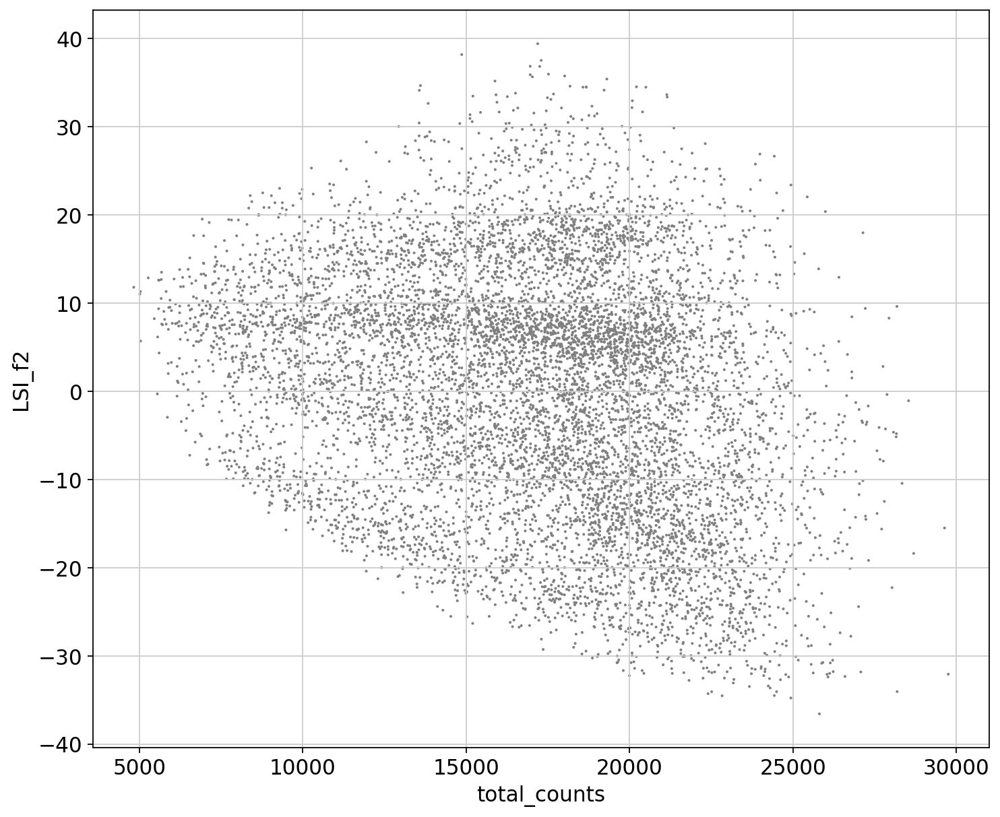

In [96]:
sc.pl.scatter(atac_adata, "total_counts", "LSI_f1")
sc.pl.scatter(atac_adata, "total_counts", "LSI_f2")

We can now compute a KNN graph for clustering and UMAP

In [97]:
sc.pp.neighbors(atac_adata, use_rep="X_lsi", n_neighbors=10, n_pcs=30)

In [98]:
sc.tl.umap(atac_adata)

In [99]:
sc.tl.leiden(atac_adata, resolution=0.5)

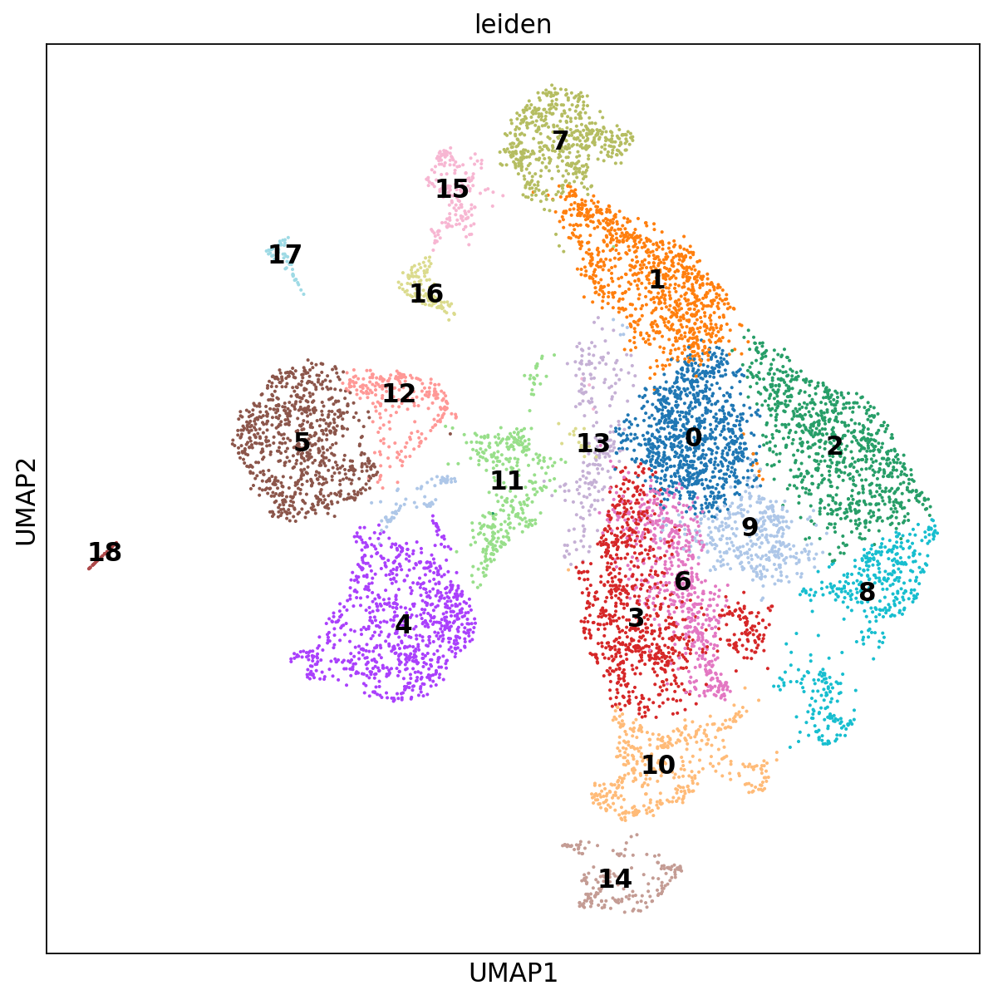

In [100]:
sc.pl.umap(atac_adata, color=["leiden"], legend_loc="on data")

### Count fragments in gene bodies and Transcription Start Sites

ATAC counts can be aggregated in order to get an estimate of how open the chromatin is in certain genome regions, e.g. around transcription start sites (TSS) of genes. For this we can extract gene locations. Counts for individual fragments from the fragments file would be usually used for this (if we aggregate from the peak matrix we might lose some info).

In [128]:
## Use all genes in Ensembl
# # release 77 uses human reference genome GRCh38
# from pyensembl import EnsemblRelease
# data = EnsemblRelease(77)
# gene_names = data.genes()
# genes_df = ens_genes2df(gene_names)

# # remove funky contigs
# chr_keep = [f'chr{x}' for x in np.arange(22).tolist() + ['X', 'Y']] 
# genes_df = genes_df[genes_df.Chromosome.isin(chr_keep)]

In [141]:
## Use genes in RNA modality
genes_df = rna_adata.var[['Chromosome', "Start", "End", "GeneName", "GeneID"]].copy()
genes_df = genes_df.dropna()
genes_df['Start'] = genes_df['Start'].astype('int')
genes_df['End'] = genes_df['End'].astype('int')

# remove funky contigs
chr_keep = [f'chr{x}' for x in np.arange(22).tolist() + ['X', 'Y']] 
genes_df = genes_df[genes_df.Chromosome.isin(chr_keep)]

## Extend genes 500 bps upstream to include promoter
if all(genes_df.Start < genes_df.End): ## strand check
    genes_df.Start = genes_df.Start - 500

In [142]:
def fragments2features(atac_adata, features_df, sample_name, data_dir,
                       sample_col='Sample_ID'):
    sample_adata = atac_adata[atac_adata.obs[sample_col] == sample_name].copy()
    ## Change obs names to match original fragment file 
    sample_adata.obs_names = [x[-1] + '-1' for x in sample_adata.obs_names.str.split("_")] 
    ac.tl.locate_fragments(sample_adata, fragments= data_dir + f'{sample_name}_atac_fragments.tsv.gz')
    adata_genes = ac.tl.count_fragments_features(sample_adata, features=features_df)
    adata_genes.obs['sample'] = sample_name
    return(adata_genes)

In [143]:
# ## This takes a fairly long time, we recommend using the precomputed version
# gene_adata_ls = []
# for s in atac_adata.obs['Sample_ID'].unique():
#     sdata = fragments2features(atac_adata, genes_df, s, data_dir)
#     gene_adata_ls.append(sdata)

100%|██████████| 25643/25643 [08:46<00:00, 48.72it/s]
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
100%|██████████| 25643/25643 [09:04<00:00, 47.09it/s]
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
100%|██████████| 25643/25643 [08:13<00:00, 51.95it/s]
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [156]:
for g in gene_adata_ls:
    g.obs_names = g.obs['Sample_ID'].astype("str") + "_" + g.obs_names.str.strip('-1')

In [163]:
for g in gene_adata_ls:
    g.var_names_make_unique()

In [164]:
gene_adata = anndata.concat(gene_adata_ls)

In [165]:
gene_adata.var = gene_adata_ls[0].var.copy()
gene_adata.var_names = gene_adata.var['GeneID'].values.copy()
gene_adata

AnnData object with n_obs × n_vars = 8981 × 25643
    obs: 'Sample_ID', 'Sample_Age', 'Sample_Batch', 'Cell_Barcode', 'Dissociation_ID', 'Assay', 'n_genes_by_counts', 'total_counts', 'LSI_f1', 'LSI_f2', 'leiden', 'sample'
    var: 'Chromosome', 'Start', 'End', 'GeneName', 'GeneID'

In [166]:
## For now let's save as a slot in atac_adata.obsm
gene_accessibility_df = gene_adata[atac_adata.obs_names].X.toarray()
# gene_accessibility_df = pd.DataFrame(gene_accessibility_df, columns = gene_adata.var_names, index=gene_adata.obs_names)
atac_adata.obsm['gene_activity'] = gene_accessibility_df.copy()

## Note that you can save additional information (such as gene annotations) in adata.uns 
atac_adata.uns['gene_activity_var'] = gene_adata.var.copy()

In [167]:
atac_adata

AnnData object with n_obs × n_vars = 8981 × 308071
    obs: 'Sample_ID', 'Sample_Age', 'Sample_Batch', 'Cell_Barcode', 'Dissociation_ID', 'Assay', 'n_genes_by_counts', 'total_counts', 'LSI_f1', 'LSI_f2', 'leiden'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'name', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'gene_activity_var'
    obsm: 'X_pca', 'X_lsi', 'X_umap', 'gene_activity'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

### Add GC bias to peaks

When testing for association between gene expression and peak accessibility, the observed correlation coefficient for each gene-peak pair is compared to the coefficients obtained matching the gene to "background peaks" with matching total accessibility and GC content to the tested one, accounting for technical biases between cells that are caused by PCR amplification or variable Tn5 tagmentation conditions. 

In this case, I've used a specific function in the R package `chromVAR` to calculate GC content (see [`addGCBias`](https://greenleaflab.github.io/chromVAR/reference/addGCBias.html)) and saved it as a BED file (`muon` is still missing a python util to calculate this).

In [168]:
gc_bias_df = pd.read_table(data_dir + 'Trevino_multiome_ATAC_clean.peaks_bias.bed', header=None)
gc_bias_df.columns = ['chr', 'start', 'end', 'width', 'strand', 'name', 'GCbias']
gc_bias_df.index = gc_bias_df.name

In [169]:
atac_adata.var['GCbias'] = gc_bias_df.loc[atac_adata.var['name'], 'GCbias'].values
atac_adata.var

,seqnames,start,end,width,strand,name,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,GCbias
0,chr1,180451,180951,501,*,c7_peak_1,34,0.016861,99.621423,151.430237,0.506986
1,chr1,181254,181754,501,*,c2_peak_1,77,0.030596,99.142634,274.779602,0.748503
2,chr1,191223,191723,501,*,c9_peak_1,84,0.037461,99.064692,336.439209,0.582834
3,chr1,630059,630559,501,*,c6_peak_5,61,0.025755,99.320788,231.303757,0.429142
4,chr1,633776,634276,501,*,c8_peak_4,58,0.029463,99.354192,264.608612,0.443114
...,...,...,...,...,...,...,...,...,...,...,...
467308,chr22,50733529,50734029,501,*,c9_peak_116149,122,0.041067,98.641577,368.819977,0.576846
467309,chr22,50739954,50740454,501,*,c2_peak_113394,36,0.014530,99.599154,130.492874,0.568862
467310,chr22,50756935,50757435,501,*,c5_peak_81501,58,0.024575,99.354192,220.706482,0.528942
467312,chr22,50775143,50775643,501,*,c8_peak_104552,40,0.015740,99.554615,141.359543,0.582834


In [170]:
atac_adata

AnnData object with n_obs × n_vars = 8981 × 308071
    obs: 'Sample_ID', 'Sample_Age', 'Sample_Batch', 'Cell_Barcode', 'Dissociation_ID', 'Assay', 'n_genes_by_counts', 'total_counts', 'LSI_f1', 'LSI_f2', 'leiden'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'name', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'GCbias'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'gene_activity_var'
    obsm: 'X_pca', 'X_lsi', 'X_umap', 'gene_activity'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

### Save output

In [171]:
# ## Save processed object
# atac_adata.write_h5ad('{d}/Trevino_multiome_ATAC_clean.preprocessed.h5ad'.format(d=data_dir))